# Battle of Cities
### Sastry Akundy

## Download and Explore dataset

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
df = pd.read_csv('all_india_PO_list_without_APS_offices_ver2_lat_long.csv')

### Drop columns

In [3]:
df_dis = df[df['Districtname'].isin(['Hyderabad','Mumbai','Chennai','Bangalore','Kolkata','New Delhi','North East Delhi','North Delhi','East Delhi','Central Delhi'])]
df_dis.loc[df_dis.loc[:,'Districtname'].str.contains("Delhi"), 'Districtname'] = 'Delhi'
df_dis.loc[:,'officename'] = df_dis.loc[:,'officename'].str.replace('B.O', '').str.replace('S.O', '').str.replace('H.O', '')
df_dis = df_dis.drop(['officeType','Deliverystatus','regionname','circlename','Telephone','Related Suboffice','Related Headoffice','longitude','latitude','divisionname','statename','Taluk'],axis=1)
df_dis

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,officename,pincode,Districtname
4674,A.Gs Office,500004,Hyderabad
4675,A.Gs. Staff Quarters,500045,Hyderabad
4676,Anandnagar (Hyderabad),500004,Hyderabad
4677,AP Police Academy PO,500091,Hyderabad
4680,Banjara Hills,500034,Hyderabad
4681,Bazarghat (Hyderabad),500004,Hyderabad
4683,Bhaskar Nagar,500075,Hyderabad
4684,C.B.I.T,500075,Hyderabad
4685,Central Secretariat,500022,Hyderabad
4686,CUC,500046,Hyderabad


In [4]:
df_dis = df_dis.reset_index(drop=True)
df_dis.rename(columns={'officename':'Neighborhood','Districtname':'District','pincode':'PIN'},inplace=True)
df_dis

,Neighborhood,PIN,District
0,A.Gs Office,500004,Hyderabad
1,A.Gs. Staff Quarters,500045,Hyderabad
2,Anandnagar (Hyderabad),500004,Hyderabad
3,AP Police Academy PO,500091,Hyderabad
4,Banjara Hills,500034,Hyderabad
5,Bazarghat (Hyderabad),500004,Hyderabad
6,Bhaskar Nagar,500075,Hyderabad
7,C.B.I.T,500075,Hyderabad
8,Central Secretariat,500022,Hyderabad
9,CUC,500046,Hyderabad


### Get latitude and longitude data

In [5]:
from geopy.geocoders import Nominatim # import geocoder
from geopy.extra.rate_limiter import RateLimiter
import geopandas

In [6]:
df_dis = df_dis.astype(str)
locator = Nominatim(user_agent="ny_explorer")
geocode = RateLimiter(locator.geocode, min_delay_seconds=0.1)

def locdata(neighborhood, pin, district):
    try:
        location = geocode(neighborhood+', '+district)
        return location
    except:
        location = geocode(pin+', '+district)
        return location
    
def locnonedata(neighborhood, pin, district):
    location = geocode(pin+', '+district)
    return location

#df_cts['location'] = df_cts['Address'].apply(geocode)

df_dis['location'] = df_dis.apply(lambda row: locdata(row['Neighborhood'],row['PIN'],row['District']), axis=1)
df_dis

RateLimiter caught an error, retrying (0/2 tries). Called with (*('I.M.Colony , Hyderabad',), **{}).
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\geopy\geocoders\base.py", line 367, in _call_geocoder
    page = requester(req, timeout=timeout, **kwargs)
  File "C:\ProgramData\Anaconda3\lib\urllib\request.py", line 525, in open
    response = self._open(req, data)
  File "C:\ProgramData\Anaconda3\lib\urllib\request.py", line 543, in _open
    '_open', req)
  File "C:\ProgramData\Anaconda3\lib\urllib\request.py", line 503, in _call_chain
    result = func(*args)
  File "C:\ProgramData\Anaconda3\lib\urllib\request.py", line 1362, in https_open
    context=self._context, check_hostname=self._check_hostname)
  File "C:\ProgramData\Anaconda3\lib\urllib\request.py", line 1322, in do_open
    r = h.getresponse()
  File "C:\ProgramData\Anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\ProgramData\Anaconda3\lib\http\c

,Neighborhood,PIN,District,location
0,A.Gs Office,500004,Hyderabad,None
1,A.Gs. Staff Quarters,500045,Hyderabad,None
2,Anandnagar (Hyderabad),500004,Hyderabad,None
3,AP Police Academy PO,500091,Hyderabad,None
4,Banjara Hills,500034,Hyderabad,"(Banjara Hills, Greater Hyderabad Municipal Co..."
5,Bazarghat (Hyderabad),500004,Hyderabad,"(SBI Bazarghat Branch, Mahavir Marg, Ward 75 R..."
6,Bhaskar Nagar,500075,Hyderabad,"(bhaskar sharma, SH1, PO Golnaka, Ward 134 Alw..."
7,C.B.I.T,500075,Hyderabad,None
8,Central Secretariat,500022,Hyderabad,"(Secretariat, Greater Hyderabad Municipal Corp..."
9,CUC,500046,Hyderabad,None


In [60]:
df_dis['location'] = df_dis.apply(lambda row: locnonedata(row['Neighborhood'],row['PIN'],row['District']) if (row['location'] == None) else row['location'], axis=1)
#create longitude, laatitude and altitude from location column (returns tuple)
df_dis['point'] = df_dis['location'].apply(lambda loc: tuple(loc.point) if loc else None)

#split point column into latitude, longitude and altitude columns
df_dis[['latitude', 'longitude', 'altitude']] = pd.DataFrame(df_dis['point'].tolist(), index=df_dis.index)
df_dis

,Neighborhood,PIN,District,location,point,latitude,longitude,altitude
0,A.Gs Office,500004,Hyderabad,"(Hyderabad, Telangana, India, (17.38878595, 78...","(17.38878595, 78.46106473453146, 0.0)",17.388786,78.461065,0.0
1,A.Gs. Staff Quarters,500045,Hyderabad,"(Hyderabad, Telangana, India, (17.38878595, 78...","(17.38878595, 78.46106473453146, 0.0)",17.388786,78.461065,0.0
2,Anandnagar (Hyderabad),500004,Hyderabad,"(Hyderabad, Telangana, India, (17.38878595, 78...","(17.38878595, 78.46106473453146, 0.0)",17.388786,78.461065,0.0
3,AP Police Academy PO,500091,Hyderabad,None,None,NaN,NaN,NaN
4,Banjara Hills,500034,Hyderabad,"(Banjara Hills, Greater Hyderabad Municipal Co...","(17.4177464, 78.4399014, 0.0)",17.417746,78.439901,0.0
5,Bazarghat (Hyderabad),500004,Hyderabad,"(SBI Bazarghat Branch, Mahavir Marg, Ward 75 R...","(17.4027867, 78.4604489, 0.0)",17.402787,78.460449,0.0
6,Bhaskar Nagar,500075,Hyderabad,"(bhaskar sharma, SH1, PO Golnaka, Ward 134 Alw...","(17.501313850000003, 78.51277653328222, 0.0)",17.501314,78.512777,0.0
7,C.B.I.T,500075,Hyderabad,"(University of Hyderabad, Masjid Banda Road, W...","(17.4534271, 78.32674059291753, 0.0)",17.453427,78.326741,0.0
8,Central Secretariat,500022,Hyderabad,"(Secretariat, Greater Hyderabad Municipal Corp...","(17.4082658, 78.4689478, 0.0)",17.408266,78.468948,0.0
9,CUC,500046,Hyderabad,"(Ward 104 Kondapur, Greater Hyderabad Municipa...","(17.4517125, 78.3658956, 0.0)",17.451712,78.365896,0.0


### Group by latitude and longitude

In [63]:
#df_dis = df_dis.astype(str)
#df_dis['Address'] = df_dis[['District','PIN']].agg(','.join,axis=1)
df_cts = df_dis.copy()
df_cts.dropna(inplace=True)
df_cts = df_cts.reset_index(drop=True)
df_cts = df_cts.groupby(['latitude','longitude']).agg({'District':'first','PIN':'first','Neighborhood':'first'}).reset_index()
#df_cts = df_cts.groupby(['latitude','longitude']).agg({'District':'first','PIN':'first'}).['Neighborhood'].apply(','.join).reset_index()
df_sum = df_cts.drop([0,255,256,300,768,769,770]).reset_index(drop=True)
#df_cts
df_sum
#df_cts = df_cts.drop(['location','point','altitude'],axis=1)

,latitude,longitude,District,PIN,Neighborhood
0,12.620112,77.479307,Bangalore,560034,Agara
1,12.672071,77.694284,Bangalore,562106,Vanakanahalli
2,12.689957,77.725314,Bangalore,562106,Guddanahalli
3,12.728407,77.639096,Bangalore,562106,Bestamaranahalli
4,12.738643,77.574580,Bangalore,560083,Ragihalli
5,12.742629,77.701482,Bangalore,562106,Byagadadenahalli
6,12.754299,77.485630,Bangalore,560082,Bolare
7,12.757227,77.647279,Bangalore,560036,Devasandra
8,12.763737,77.655377,Bangalore,560105,Haragadde
9,12.771203,77.622794,Bangalore,560105,Kallubalu


### Locate all cities on map

In [64]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans
import folium # map rendering library

In [65]:


map_India = folium.Map(location=[18, 80], zoom_start=5)

# add markers to map
for lat, lng, borough, neighborhood in zip(df_sum['latitude'], df_sum['longitude'], df_sum['PIN'], df_sum['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_India)  
    
map_India

In [74]:
CLIENT_ID = 'T4DYKNYXBXXMJXNZ4MFHEF0XK3AUOQFLPKFUF3IDTX1TYDJ3' # your Foursquare ID
CLIENT_SECRET = 'CEDB0ZQDDLZXTQSBZVYKAE4FV1QFSP23UFDHFCET4PDXNBJW' # your Foursquare Secret
VERSION = '20200105' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: T4DYKNYXBXXMJXNZ4MFHEF0XK3AUOQFLPKFUF3IDTX1TYDJ3
CLIENT_SECRET:CEDB0ZQDDLZXTQSBZVYKAE4FV1QFSP23UFDHFCET4PDXNBJW


In [75]:
df_sum.loc[0, 'Neighborhood']

'Agara '

In [76]:
neighborhood_latitude = df_sum.loc[0, 'latitude'] # neighborhood latitude value
neighborhood_longitude = df_sum.loc[0, 'longitude'] # neighborhood longitude value

neighborhood_name = df_sum.loc[0, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Agara  are 12.6201123, 77.4793074.


In [77]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 5000 # define radius

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # display URL


'https://api.foursquare.com/v2/venues/explore?&client_id=T4DYKNYXBXXMJXNZ4MFHEF0XK3AUOQFLPKFUF3IDTX1TYDJ3&client_secret=CEDB0ZQDDLZXTQSBZVYKAE4FV1QFSP23UFDHFCET4PDXNBJW&v=20200105&ll=12.6201123,77.4793074&radius=5000&limit=100'

In [78]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5f12f103ea795307abee7db7'},
 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 2,
  'suggestedBounds': {'ne': {'lat': 12.665112345000045,
    'lng': 77.52533545673062},
   'sw': {'lat': 12.575112254999956, 'lng': 77.43327934326938}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4fc8be6fe4b003326fce9e22',
       'name': 'collesseum',
       'location': {'address': 'Jgi',
        'lat': 12.637595771663637,
        'lng': 77.44309476166923,
        'labeledLatLngs': [{'label': 'display',
     

In [48]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [49]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.shape

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  This is separate from the ipykernel package so we can avoid doing imports until


(100, 4)

### Get venue data

In [79]:
def getNearbyVenues(names, latitudes, longitudes, radius=2000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [212]:
Mumbai_data = df_sum.loc[(df_sum['District'] == 'Mumbai')|(df_sum['District'] == 'Bangalore')|(df_sum['District'] == 'Delhi')]
#Bangalore_data = df_sum.loc[df_sum['District'] == 'Bangalore']

Mumbai_venues = getNearbyVenues(names=Mumbai_data['Neighborhood'],
                                   latitudes=Mumbai_data['latitude'],
                                   longitudes=Mumbai_data['longitude']
                                  )

Agara 
Vanakanahalli 
Guddanahalli 
Bestamaranahalli 
Ragihalli 
Byagadadenahalli 
Bolare 
Devasandra 
Haragadde 
Kallubalu 
Attibele 
Neralur 
Jigani 
Hennagara 
Yadavanahalli 
Anekal 
Bommasandra Industrial Estate 
Chandapura 
Bidaraguppe 
Muthanallur 
Hulimangala 
Wipro Limited 
Bannerghatta Road 
Electronics City 
Gottigere 
Anjanapura 
Sarjapura 
Begur 
Mount St Joseph 
Thalaghattapura 
Hulimavu 
Dommasandra 
Kumbalagodu 
Konanakunte 
Subramanyapura 
Doddakallasandra 
Kugur 
Bannerghatta 
Yelachenahalli 
Ramohalli 
Kumaraswamy Layout 
Bommanahalli  (Bangalore)
Chunchanakuppe 
J P Nagar 
Chudenapura 
Kumbalgodu Gollahalli 
HSR Layout 
Neriga 
Chikkalasandra 
Mico Layout 
Banashankari 
Rv Niketan 
Madivala 
Carmelram 
K. G. Road 
Kathriguppe 
Koramangala I Block 
St. John's Medical College 
Tilaknagar  (Bangalore)
Jayanagar 
Dharmaram College 
Panathur 
Madhavan Park 
Muthusandra 
Banashankari III Stage 
Girinagar  (Bangalore)
Nayandahalli 
Basavanagudi 
Sri Chowdeshwari 
Adugodi 
W

In [81]:
Bangalore_venues = getNearbyVenues(names=Bangalore_data['Neighborhood'],
                                   latitudes=Bangalore_data['latitude'],
                                   longitudes=Bangalore_data['longitude']
                                  )

Agara 
Vanakanahalli 
Guddanahalli 
Bestamaranahalli 
Ragihalli 
Byagadadenahalli 
Bolare 
Devasandra 
Haragadde 
Kallubalu 
Attibele 
Neralur 
Jigani 
Hennagara 
Yadavanahalli 
Anekal 
Bommasandra Industrial Estate 
Chandapura 
Bidaraguppe 
Muthanallur 
Hulimangala 
Wipro Limited 
Bannerghatta Road 
Electronics City 
Gottigere 
Anjanapura 
Sarjapura 
Begur 
Mount St Joseph 
Thalaghattapura 
Hulimavu 
Dommasandra 
Kumbalagodu 
Konanakunte 
Subramanyapura 
Doddakallasandra 
Kugur 
Bannerghatta 
Yelachenahalli 
Ramohalli 
Kumaraswamy Layout 
Bommanahalli  (Bangalore)
Chunchanakuppe 
J P Nagar 
Chudenapura 
Kumbalgodu Gollahalli 
HSR Layout 
Neriga 
Chikkalasandra 
Mico Layout 
Banashankari 
Rv Niketan 
Madivala 
Carmelram 
K. G. Road 
Kathriguppe 
Koramangala I Block 
St. John's Medical College 
Tilaknagar  (Bangalore)
Jayanagar 
Dharmaram College 
Panathur 
Madhavan Park 
Muthusandra 
Banashankari III Stage 
Girinagar  (Bangalore)
Nayandahalli 
Basavanagudi 
Sri Chowdeshwari 
Adugodi 
W

In [85]:
Bangalore_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
A F Station Yelahanka,100,100,100,100,100,100
Adugodi,67,67,67,67,67,67
Amruthahalli,36,36,36,36,36,36
Anandnagar (Bangalore),62,62,62,62,62,62
Anekal,3,3,3,3,3,3
Anjanapura,4,4,4,4,4,4
Arabic College,38,38,38,38,38,38
Attibele,8,8,8,8,8,8
Attur,8,8,8,8,8,8


In [86]:
print('There are {} uniques categories.'.format(len(Bangalore_venues['Venue Category'].unique())))

There are 248 uniques categories.


In [214]:
Mumbai_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
A F Station Yelahanka,100,100,100,100,100,100
A I Staff Colony,82,82,82,82,82,82
Adugodi,60,60,60,60,60,60
Agripada,86,86,86,86,86,86
Airport (Mumbai),88,88,88,88,88,88
Ambewadi (Mumbai),87,87,87,87,87,87
Amruthahalli,39,39,39,39,39,39
Anand Parbat,35,35,35,35,35,35
Anand Vihar,32,32,32,32,32,32


In [215]:
print('There are {} uniques categories.'.format(len(Mumbai_venues['Venue Category'].unique())))

There are 333 uniques categories.


## Analyze Each Neighborhood

In [131]:
#Mumbai_Bangalore = Mumbai_venues.append(Bangalore_venues, ignore_index = True) 

In [219]:
# one hot encoding
Mumbai_onehot = pd.get_dummies(Mumbai_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Mumbai_onehot['Neighborhood'] = Mumbai_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [Mumbai_onehot.columns[-1]] + list(Mumbai_onehot.columns[:-1])
Mumbai_onehot = Mumbai_onehot[fixed_columns]

Mumbai_onehot.head()

,Zoo,ATM,Accessories Store,Afghan Restaurant,Airport,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Andhra Restaurant,Antique Shop,Aquarium,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Bengali Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Campground,Candy Store,Capitol Building,Casino,Castle,Chaat Place,Cheese Shop,Chettinad Restaurant,Chinese Restaurant,Chocolate Shop,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Auditorium,College Gym,Comedy Club,Comfort Food Restaurant,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cricket Ground,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dhaba,Dim Sum Restaurant,Diner,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Event Service,Event Space,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Goan Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health Food Store,Henan Restaurant,High School,Hindu Temple,Historic Site,History Museum,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hyderabadi Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indian Sweet Shop,Indie Movie Theater,Indoor Play Area,Internet Cafe,Intersection,Irani Cafe,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karnataka Restaurant,Kebab Restaurant,Kerala Restaurant,Korean Restaurant,Lake,Light Rail Station,Lighthouse,Lighting Store,Liquor Store,Lounge,Luggage Store,Maharashtrian Restaurant,Market,Martial Arts Dojo,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Mosque,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Mughlai Restaurant,Multicuisine Indian Restaurant,Multiplex,Museum,Music Store,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,North Indian Restaurant,Northeast Indian Restaurant,Office,Opera House,Optical Shop,Other Great Outdoors,Other Nightlife,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Parsi Restaurant,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Pier,Pizza Place,Planetarium,Platform,Playground,Plaza,Pool,Pool Hall,Portuguese Restaurant,Print Shop,Pub,Public Art,Punjabi Restaurant,Racetrack,Rajasthani Restaurant,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Road,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,

In [220]:
Mumbai_grouped = Mumbai_onehot.groupby('Neighborhood').mean().reset_index()
Mumbai_grouped

,Neighborhood,Zoo,ATM,Accessories Store,Afghan Restaurant,Airport,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Andhra Restaurant,Antique Shop,Aquarium,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Bengali Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Campground,Candy Store,Capitol Building,Casino,Castle,Chaat Place,Cheese Shop,Chettinad Restaurant,Chinese Restaurant,Chocolate Shop,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Auditorium,College Gym,Comedy Club,Comfort Food Restaurant,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cricket Ground,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dhaba,Dim Sum Restaurant,Diner,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Event Service,Event Space,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Goan Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health Food Store,Henan Restaurant,High School,Hindu Temple,Historic Site,History Museum,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hyderabadi Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indian Sweet Shop,Indie Movie Theater,Indoor Play Area,Internet Cafe,Intersection,Irani Cafe,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karnataka Restaurant,Kebab Restaurant,Kerala Restaurant,Korean Restaurant,Lake,Light Rail Station,Lighthouse,Lighting Store,Liquor Store,Lounge,Luggage Store,Maharashtrian Restaurant,Market,Martial Arts Dojo,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Mosque,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Mughlai Restaurant,Multicuisine Indian Restaurant,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Nightclub,Noodle House,North Indian Restaurant,Northeast Indian Restaurant,Office,Opera House,Optical Shop,Other Great Outdoors,Other Nightlife,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Parsi Restaurant,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Pier,Pizza Place,Planetarium,Platform,Playground,Plaza,Pool,Pool Hall,Portuguese Restaurant,Print Shop,Pub,Public Art,Punjabi Restaurant,Racetrack,Rajasthani Restaurant,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Road,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,

In [221]:
Mumbai_grouped.shape

(427, 333)

In [222]:
num_top_venues = 5

for hood in Mumbai_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Mumbai_grouped[Mumbai_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----A F Station Yelahanka ----
               venue  freq
0  Indian Restaurant  0.13
1              Hotel  0.07
2             Lounge  0.05
3               Café  0.04
4     Ice Cream Shop  0.03


----A I Staff Colony ----
                venue  freq
0   Indian Restaurant  0.17
1                Café  0.07
2         Coffee Shop  0.07
3         Pizza Place  0.06
4  Chinese Restaurant  0.05


----Adugodi ----
               venue  freq
0  Indian Restaurant  0.12
1               Café  0.07
2        Coffee Shop  0.05
3          Juice Bar  0.05
4     Clothing Store  0.03


----Agripada ----
                  venue  freq
0     Indian Restaurant  0.13
1                   Bar  0.06
2            Restaurant  0.06
3                Bakery  0.05
4  Fast Food Restaurant  0.05


----Airport  (Mumbai)----
               venue  freq
0              Hotel  0.10
1  Indian Restaurant  0.10
2        Coffee Shop  0.08
3               Café  0.07
4             Lounge  0.06


----Ambewadi  (Mumbai)----
           

                  venue  freq
0                   ATM   0.2
1  Fast Food Restaurant   0.2
2                Resort   0.2
3             Racetrack   0.2
4                  Café   0.2


----Bommanahalli  (Bangalore)----
               venue  freq
0  Indian Restaurant  0.23
1               Café  0.07
2     Ice Cream Shop  0.06
3        Coffee Shop  0.05
4        Pizza Place  0.05


----Bommasandra Industrial Estate ----
               venue  freq
0         Food Court  0.17
1              Hotel  0.17
2             Casino  0.17
3       Tech Startup  0.17
4  Indian Restaurant  0.17


----Borivali ----
                venue  freq
0   Indian Restaurant  0.11
1                Café  0.09
2          Restaurant  0.06
3      Ice Cream Shop  0.05
4  Chinese Restaurant  0.05


----Borivali East ----
                venue  freq
0   Indian Restaurant  0.10
1                Café  0.10
2      Ice Cream Shop  0.06
3      Sandwich Place  0.05
4  Chinese Restaurant  0.05


----Borivali West ----
             

               venue  freq
0  Indian Restaurant  0.15
1               Café  0.15
2     Breakfast Spot  0.12
3      Metro Station  0.08
4        Pizza Place  0.08


----Gokhale Road  (Mumbai)----
                venue  freq
0   Indian Restaurant  0.14
1                Café  0.07
2              Bakery  0.06
3         Coffee Shop  0.05
4  Chinese Restaurant  0.05


----Goregaon  (Mumbai)----
                  venue  freq
0  Fast Food Restaurant  0.13
1     Indian Restaurant  0.09
2           Coffee Shop  0.06
3             Multiplex  0.06
4           Pizza Place  0.05


----Goregaon East ----
                  venue  freq
0  Fast Food Restaurant  0.14
1     Indian Restaurant  0.13
2           Pizza Place  0.04
3    Chinese Restaurant  0.04
4             Multiplex  0.04


----Gottigere ----
               venue  freq
0  Indian Restaurant  0.29
1         Food Truck  0.14
2        Bus Station  0.14
3             Resort  0.14
4   Department Store  0.14


----Govandi ----
                  ven

                  venue  freq
0     Indian Restaurant  0.13
1  Fast Food Restaurant  0.13
2                  Café  0.06
3           Pizza Place  0.05
4           Coffee Shop  0.05


----Kannamangala ----
                            venue  freq
0            Karnataka Restaurant  0.25
1               Indian Restaurant  0.25
2  Multicuisine Indian Restaurant  0.25
3                   Moving Target  0.25
4                          Mosque  0.00


----Kannamwar Nagar ----
                           venue  freq
0                           Café  0.14
1                  Train Station  0.14
2                Coworking Space  0.07
3  Vegetarian / Vegan Restaurant  0.07
4         Furniture / Home Store  0.07


----Kannur ----
         venue  freq
0         Café  0.23
1  Pizza Place  0.08
2        Diner  0.08
3   Smoke Shop  0.08
4    Multiplex  0.08


----Karawal Nagar ----
               venue  freq
0                ATM  0.71
1   Business Service  0.14
2  Mobile Phone Shop  0.14
3               Pi

                     venue  freq
0           Scenic Lookout   1.0
1                      Zoo   0.0
2             Noodle House   0.0
3  New American Restaurant   0.0
4              Music Venue   0.0


----Mhada Colony ----
                  venue  freq
0     Indian Restaurant  0.19
1  Fast Food Restaurant  0.13
2           Pizza Place  0.10
3        Ice Cream Shop  0.06
4           Bus Station  0.06


----Mico Layout ----
                venue  freq
0   Indian Restaurant  0.21
1      Ice Cream Shop  0.06
2              Bakery  0.05
3  Chinese Restaurant  0.05
4         Snack Place  0.05


----Minto Road ----
                  venue  freq
0     Indian Restaurant  0.18
1                 Hotel  0.09
2                  Café  0.07
3                   Bar  0.05
4  Fast Food Restaurant  0.03


----Mori Road ----
                venue  freq
0   Indian Restaurant  0.19
1                Café  0.10
2  Chinese Restaurant  0.06
3                 Bar  0.04
4         Coffee Shop  0.04


----Motilal Na

4        Ice Cream Shop  0.05


----Rajanakunte ----
          venue  freq
0         Hotel   0.2
1  Cupcake Shop   0.2
2    Restaurant   0.2
3        Resort   0.2
4          Café   0.2


----Rajawadi ----
                  venue  freq
0     Indian Restaurant  0.18
1           Coffee Shop  0.08
2  Fast Food Restaurant  0.07
3            Restaurant  0.06
4                  Café  0.06


----Rajendra Nagar  (Mumbai)----
                  venue  freq
0     Indian Restaurant  0.11
1                  Café  0.07
2  Fast Food Restaurant  0.06
3        Ice Cream Shop  0.06
4            Restaurant  0.06


----Ram Nagar  (East Delhi)----
                  venue  freq
0     Indian Restaurant  0.16
1                 Hotel  0.11
2                  Café  0.07
3  Fast Food Restaurant  0.07
4                   Bar  0.06


----Ramamurthy Nagar ----
                     venue  freq
0        Indian Restaurant  0.29
1              Bus Station  0.14
2              Pizza Place  0.07
3  South Indian Restaurant

                  venue  freq
0     Indian Restaurant  0.12
1  Fast Food Restaurant  0.07
2    Chinese Restaurant  0.05
3                Bakery  0.05
4                  Café  0.05


----Vimanapura ----
                  venue  freq
0     Indian Restaurant  0.32
1  Fast Food Restaurant  0.07
2                  Café  0.07
3    Chinese Restaurant  0.04
4            Restaurant  0.03


----Virgonagar ----
           venue  freq
0           Café  0.33
1           Lake  0.33
2  Event Service  0.33
3      Multiplex  0.00
4   Noodle House  0.00


----Vishwas Nagar ----
                  venue  freq
0           Pizza Place  0.15
1                 Hotel  0.10
2  Fast Food Restaurant  0.10
3    Athletics & Sports  0.05
4                  Park  0.05


----Vivek Vihar ----
               venue  freq
0              Hotel  0.20
1        Pizza Place  0.15
2  Indian Restaurant  0.15
3              Diner  0.05
4               Café  0.05


----Viveknagar  (Bangalore)----
               venue  freq
0  Indi

In [223]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [224]:
import numpy as np

In [276]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Mumbai_grouped['Neighborhood']

for ind in np.arange(Mumbai_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Mumbai_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,A F Station Yelahanka,Indian Restaurant,Hotel,Lounge,Café,Ice Cream Shop,Chinese Restaurant,Seafood Restaurant,French Restaurant,Italian Restaurant,Japanese Restaurant
1,A I Staff Colony,Indian Restaurant,Coffee Shop,Café,Pizza Place,Chinese Restaurant,Fast Food Restaurant,Bar,Hotel,Beer Garden,Donut Shop
2,Adugodi,Indian Restaurant,Café,Juice Bar,Coffee Shop,Multiplex,Fast Food Restaurant,Breakfast Spot,Chinese Restaurant,Gym,Dessert Shop
3,Agripada,Indian Restaurant,Restaurant,Bar,Fast Food Restaurant,Bakery,Lounge,Coffee Shop,Dessert Shop,Chinese Restaurant,Ice Cream Shop
4,Airport (Mumbai),Hotel,Indian Restaurant,Coffee Shop,Café,Lounge,Fast Food Restaurant,Sandwich Place,Seafood Restaurant,Smoke Shop,Italian Restaurant


## Cluster data

In [249]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

In [277]:
distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,20) 

cluster_groups = Mumbai_grouped.drop('Neighborhood', 1)
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(cluster_groups) 
    kmeanModel.fit(cluster_groups)     
      
    distortions.append(sum(np.min(cdist(cluster_groups, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / cluster_groups.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(cluster_groups, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / cluster_groups.shape[0] 
    mapping2[k] = kmeanModel.inertia_

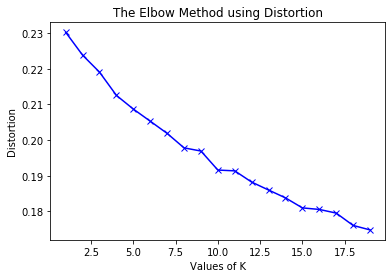

In [278]:

plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show()

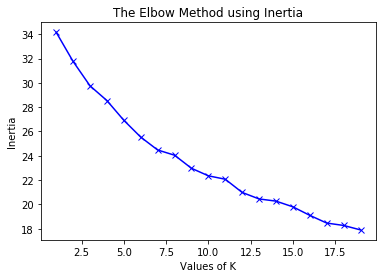

In [279]:
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show() 

In [280]:
# set number of clusters
kclusters = 10

Mumbai_grouped_clustering = Mumbai_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Mumbai_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([4, 1, 4, 4, 9, 4, 1, 1, 4, 1])

In [281]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Mumbai_merged = Mumbai_data.append(Bangalore_data, ignore_index = True) 

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
Mumbai_merged = Mumbai_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

Mumbai_merged.dropna(inplace=True)

In [282]:
# create map
map_clusters = folium.Map(location=[19, 73], zoom_start=5)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Mumbai_merged['latitude'], Mumbai_merged['longitude'], Mumbai_merged['Neighborhood'], Mumbai_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        #fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [262]:
#Mumbai_merged.loc[Mumbai_merged['District'] == 'Mumbai', Mumbai_merged.columns[[2,4] + list(range(6, Mumbai_merged.shape[1]))]]
#Mumbai_merged.loc[Mumbai_merged['District'] == 'Mumbai']

,latitude,longitude,District,PIN,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
176,18.900689,72.816134,Mumbai,400005,Asvini,0.0,Spa,Italian Restaurant,Coffee Shop,Indian Restaurant,Food Truck,Gym,Shopping Mall,Snack Place,Beach,General Entertainment
177,18.915091,72.825969,Mumbai,400005,Colaba,0.0,Café,Indian Restaurant,Hotel,Bar,Japanese Restaurant,Coffee Shop,Dessert Shop,Restaurant,Italian Restaurant,Spa
178,18.925343,72.818028,Mumbai,400021,Nariman Point,0.0,Indian Restaurant,Café,Hotel,Cricket Ground,Coffee Shop,Bar,Japanese Restaurant,Ice Cream Shop,Asian Restaurant,Italian Restaurant
179,18.927662,72.827039,Mumbai,400032,Mantralaya (Mumbai),0.0,Indian Restaurant,Hotel,Café,Bar,Cricket Ground,Japanese Restaurant,Restaurant,Theater,Asian Restaurant,Coffee Shop
180,18.928665,72.832264,Mumbai,400003,Null Bazar,0.0,Indian Restaurant,Hotel,Café,Japanese Restaurant,Bar,Cricket Ground,Dessert Shop,Asian Restaurant,Coffee Shop,Chinese Restaurant
181,18.929668,72.823355,Mumbai,400021,New Yogakshema,0.0,Indian Restaurant,Hotel,Café,Bar,Cricket Ground,Japanese Restaurant,Restaurant,Theater,Asian Restaurant,Coffee Shop
182,18.934319,72.835806,Mumbai,400001,Bazargate,0.0,Hotel,Café,Indian Restaurant,Bar,Cricket Ground,Ice Cream Shop,Chinese Restaurant,Bakery,Asian Restaurant,Japanese Restaurant
183,18.935957,72.827340,Mumbai,400020,Churchgate,0.0,Indian Restaurant,Café,Hotel,Bar,Cricket Ground,Restaurant,Ice Cream Shop,Japanese Restaurant,Coffee Shop,Dessert Shop
184,18.938771,72.835335,Mumbai,400012,BEST STaff Quarters,0.0,Indian Restaurant,Café,Hotel,Fast Food Restaurant,Bakery,Ice Cream Shop,Cricket Ground,Bar,Asian Restaurant,Coffee Shop
185,18.941065,72.793917,Mumbai,400010,V K Bhavan,0.0,Indian Restaurant,Restaurant,Food Truck,Park,Coffee Shop,Vegetarian / Vegan Restaurant,Fast Food Restaurant,Ice Cream Shop,Lighthouse,Dessert Shop


In [283]:
Mumbai_Clusters = Mumbai_merged.loc[Mumbai_merged['District'] == 'Mumbai']
Bangalore_Clusters = Mumbai_merged.loc[Mumbai_merged['District'] == 'Bangalore']
Delhi_Clusters = Mumbai_merged.loc[Mumbai_merged['District'] == 'Delhi']

In [284]:
Mumbai_Clusters.groupby('Cluster Labels').count()

,latitude,longitude,District,PIN,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,,,,,
1.0,71,71,71,71,71,71,71,71,71,71,71,71,71,71,71
4.0,87,87,87,87,87,87,87,87,87,87,87,87,87,87,87
7.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
9.0,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5


In [285]:
Bangalore_Clusters.groupby('Cluster Labels').count()

,latitude,longitude,District,PIN,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,,,,,
0.0,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
1.0,112,112,112,112,112,112,112,112,112,112,112,112,112,112,112
2.0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
3.0,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
4.0,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108
5.0,44,44,44,44,44,44,44,44,44,44,44,44,44,44,44
6.0,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24
8.0,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
9.0,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22


In [286]:
Delhi_Clusters.groupby('Cluster Labels').count()

,latitude,longitude,District,PIN,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,,,,,
1.0,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7
4.0,44,44,44,44,44,44,44,44,44,44,44,44,44,44,44
6.0,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
8.0,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13
9.0,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29


In [288]:
Mumbai_merged.loc[Mumbai_merged['Cluster Labels'] == 1, Mumbai_merged.columns[[2,4] + list(range(6, Mumbai_merged.shape[1]))]]

,District,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,Bangalore,Attibele,Rest Area,Hotel Bar,Castle,Diner,Liquor Store,Indian Restaurant,ATM,Fish Market,Fish & Chips Shop,Electronics Store
33,Bangalore,Konanakunte,Pizza Place,Department Store,South Indian Restaurant,Indian Restaurant,Vegetarian / Vegan Restaurant,Indie Movie Theater,Restaurant,Coffee Shop,Café,Breakfast Spot
38,Bangalore,Yelachenahalli,Indian Restaurant,Chinese Restaurant,Breakfast Spot,South Indian Restaurant,Fast Food Restaurant,Ice Cream Shop,Pizza Place,Department Store,Sandwich Place,Café
41,Bangalore,Bommanahalli (Bangalore),Indian Restaurant,Café,Ice Cream Shop,Pizza Place,Coffee Shop,Snack Place,Vegetarian / Vegan Restaurant,Fast Food Restaurant,Bakery,Sandwich Place
43,Bangalore,J P Nagar,Indian Restaurant,Café,Chinese Restaurant,Coffee Shop,Ice Cream Shop,South Indian Restaurant,Brewery,Fast Food Restaurant,Breakfast Spot,Snack Place
46,Bangalore,HSR Layout,Indian Restaurant,Café,Pizza Place,Ice Cream Shop,Department Store,Italian Restaurant,Chinese Restaurant,Liquor Store,Burger Joint,Bus Station
49,Bangalore,Mico Layout,Indian Restaurant,Ice Cream Shop,Bakery,Chinese Restaurant,Snack Place,Fast Food Restaurant,Coffee Shop,Sandwich Place,Pizza Place,Diner
50,Bangalore,Banashankari,Indian Restaurant,Ice Cream Shop,Fast Food Restaurant,Chinese Restaurant,Coffee Shop,Café,Pizza Place,South Indian Restaurant,Italian Restaurant,Bakery
51,Bangalore,Rv Niketan,Indian Restaurant,Café,Department Store,Ice Cream Shop,Bus Station,Sandwich Place,Grocery Store,Restaurant,Train Station,Pizza Place
52,Bangalore,Madivala,Indian Restaurant,Café,Ice Cream Shop,Dessert Shop,Coffee Shop,Chinese Restaurant,Bakery,Lounge,Pizza Place,Multiplex


In [289]:
selected_data = Mumbai_merged.loc[Mumbai_merged['Cluster Labels'] == 1, Mumbai_merged.columns[[2,4] + list(range(6, Mumbai_merged.shape[1]))]]

In [293]:
selected_data['2nd Most Common Venue'].unique()

array(['Hotel Bar', 'Department Store', 'Chinese Restaurant', 'Café',
       'Ice Cream Shop', 'Pizza Place', 'Coffee Shop', 'Breakfast Spot',
       'Indian Restaurant', 'Vegetarian / Vegan Restaurant',
       'Fast Food Restaurant', 'Construction & Landscaping', 'Hotel',
       'Tea Room', 'Multiplex', 'Restaurant', 'Dessert Shop', 'Bar',
       'Bakery', 'Sandwich Place', 'Asian Restaurant', 'Pub',
       'Train Station', 'Pool'], dtype=object)